# Urban Change Detection — NDVI/NDBI Change Between Two Sentinel-2 Dates

**Library:** [`sitex`](../sitex) · **Original, fully-documented version:** [`02-ENV-Urban_change_detection.ipynb`](../documentations/02-ENV-Urban_change_detection.ipynb)

Thin, parameterized version of the change-detection workflow. All the numeric logic
lives in `sitex.env.change_detection`; this notebook is the parameters, the calls, and
the plots.

**Inputs:** two Sentinel-2 L2A 3-band composites (B04·B08·B11), one per date, from
`00-Data-Acquisition_RemoteSensing.ipynb`'s OpenEO step (which already resamples B11
from its native 20 m to 10 m so it shares a grid with B04/B08). Change is classified two
independent ways: a fixed threshold and unsupervised K-Means — reading the *same* change
layer two different ways.

## 1. Install & import

In [1]:
# One-time setup, if `sitex` isn't already installed in this kernel:
# %pip install "sitex[env] @ git+https://github.com/ArchiColab/sitex.git"

import sys
from pathlib import Path

IN_COLAB = "google.colab" in sys.modules
print("Running in:", "Google Colab" if IN_COLAB else "Local environment")

if IN_COLAB:
    %pip install "sitex[env] @ git+https://github.com/ArchiColab/sitex.git"

    from google.colab import drive
    drive.mount("/content/gdrive")

    DATA_DIR = Path("/content/gdrive/MyDrive/Colab_Outputs")
    OUTPUT_DIR = Path("/content/gdrive/MyDrive/SiteX_Outputs")

    if not (DATA_DIR / "overture").is_dir():
        raise FileNotFoundError(
            f"{DATA_DIR} not found (or incomplete) in your Google Drive. "
            "Before the workshop: download the workshop data zip and unzip it into "
            "My Drive/Colab_Outputs -- see the workshop setup instructions."
        )
else:
    DATA_DIR = Path("..") / "data"
    OUTPUT_DIR = Path("..") / "outputs"

DATA_DIR.mkdir(parents=True, exist_ok=True)
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

import numpy as np
from IPython.display import Image, display

from sitex.core.raster_viz import add_caption, add_legend, colorize_array, colorize_categorical, hstack_images, save_array_png
from sitex.env import change_detection as cd

## 2. Configuration

In [2]:
SEN_DIR = DATA_DIR / "sentinel2"

YEAR_EARLY = 2017
YEAR_RECENT = 2026
local_lat, local_lon = 13.9833, 108.0000

s2_early_path = SEN_DIR / f"s2_{YEAR_EARLY}_B04_B08_B11.tif"
s2_recent_path = SEN_DIR / f"s2_{YEAR_RECENT}_B04_B08_B11.tif"
for p in (s2_early_path, s2_recent_path):
    if not p.exists():
        raise FileNotFoundError(f"{p} not found — run the OpenEO download cells in the acquisition notebook first.")

print(f"Comparing {YEAR_EARLY} \u2192 {YEAR_RECENT}")

Comparing 2017 → 2026


## 3. Load bands, compute NDVI & NDBI

In [3]:
b04_t1, profile = cd.load_band(s2_early_path, band_index=1)
b08_t1, _ = cd.load_band(s2_early_path, band_index=2)
b11_t1, _ = cd.load_band(s2_early_path, band_index=3)
b04_t2, _ = cd.load_band(s2_recent_path, band_index=1)
b08_t2, _ = cd.load_band(s2_recent_path, band_index=2)
b11_t2, _ = cd.load_band(s2_recent_path, band_index=3)
print(f"CRS: {profile.get('crs')}")

r1, n1, sw1 = cd.normalize_band(b04_t1), cd.normalize_band(b08_t1), cd.normalize_band(b11_t1)
r2, n2, sw2 = cd.normalize_band(b04_t2), cd.normalize_band(b08_t2), cd.normalize_band(b11_t2)

ndvi_t1, ndvi_t2 = cd.compute_ndvi(n1, r1), cd.compute_ndvi(n2, r2)
ndbi_t1, ndbi_t2 = cd.compute_ndbi(sw1, n1), cd.compute_ndbi(sw2, n2)

dndvi = np.nanmean(ndvi_t2 - ndvi_t1)
dndbi = np.nanmean(ndbi_t2 - ndbi_t1)
print(f"NDVI  T1={np.nanmean(ndvi_t1):+.3f}  T2={np.nanmean(ndvi_t2):+.3f}  \u0394={dndvi:+.3f}")
print(f"NDBI  T1={np.nanmean(ndbi_t1):+.3f}  T2={np.nanmean(ndbi_t2):+.3f}  \u0394={dndbi:+.3f}")

CRS: EPSG:32649
NDVI  T1=+0.488  T2=+0.449  Δ=-0.038
NDBI  T1=-0.053  T2=-0.019  Δ=+0.034


## 4. Change detection — threshold + K-Means

`INDEX` selects which layer drives the classification (`"ndvi"` or `"ndbi"`). K-Means
labels are re-ordered so 0 = smallest change magnitude, n-1 = largest — the raw cluster
IDs sklearn assigns are otherwise arbitrary.

**K-Means runs by default (`RUN_KMEANS = True`)**, matching the original notebook.
Earlier versions of this notebook disabled K-Means by default over a suspected
`scikit-learn`/`threadpoolctl` DLL conflict in this project's `gis` conda environment.
Re-tested directly against `envs/gis` with the environment properly activated — bare
`KMeans().fit()`, through `sitex`, and via this module's `kmeans_change()` — and it runs
cleanly; the earlier crash traced back to testing the interpreter without activating the
conda environment first, not to a real conflict. scikit-learn does still warn about a
known Windows/MKL memory-leak when there are fewer data chunks than available threads
(fix: set `OMP_NUM_THREADS=1` if it comes up) — a performance note, not a crash. If
K-Means ever does misbehave in your setup, set `RUN_KMEANS = False` — the threshold
classification above doesn't depend on scikit-learn at all, so it's unaffected either
way.

In [4]:
INDEX = "ndvi"
RUN_KMEANS = True  # see Section 4 markdown
idx_t1, idx_t2 = (ndvi_t1, ndvi_t2) if INDEX == "ndvi" else (ndbi_t1, ndbi_t2)

change = cd.compute_change(idx_t1, idx_t2)
classified = cd.threshold_change(change, low=cd.DEFAULT_DECREASE_THRESHOLD, high=cd.DEFAULT_INCREASE_THRESHOLD)

km_labels = cd.kmeans_change(change, n_clusters=3) if RUN_KMEANS else None

total = int(np.sum(np.isfinite(change)))
decreased = int((classified == -1).sum())
increased = int((classified == 1).sum())
pct_expansion = 100 * decreased / total
pct_revegetation = 100 * increased / total
pct_unchanged = 100 * (total - decreased - increased) / total
print(f"Urban expansion : {pct_expansion:.1f}%")
print(f"Revegetation    : {pct_revegetation:.1f}%")
print(f"Unchanged       : {pct_unchanged:.1f}%")

Urban expansion : 47.0%
Revegetation    : 28.3%
Unchanged       : 24.7%


c:\Users\Maddie\anaconda3\envs\gis\lib\site-packages\threadpoolctl.py:1226: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


## 5. Save rasters

In [5]:
cd.save_raster(ndvi_t1, profile, OUTPUT_DIR / f"ndvi_{YEAR_EARLY}.tif")
cd.save_raster(ndvi_t2, profile, OUTPUT_DIR / f"ndvi_{YEAR_RECENT}.tif")
cd.save_raster(ndbi_t1, profile, OUTPUT_DIR / f"ndbi_{YEAR_EARLY}.tif")
cd.save_raster(ndbi_t2, profile, OUTPUT_DIR / f"ndbi_{YEAR_RECENT}.tif")
cd.save_raster(change, profile, OUTPUT_DIR / f"change_{YEAR_EARLY}_{YEAR_RECENT}.tif")
cd.save_raster(classified.astype(np.float32), profile, OUTPUT_DIR / f"classified_{YEAR_EARLY}_{YEAR_RECENT}.tif")
if km_labels is not None:
    cd.save_raster(km_labels.astype(np.float32), profile, OUTPUT_DIR / f"kmeans_{YEAR_EARLY}_{YEAR_RECENT}.tif")
print(f"Rasters saved to {OUTPUT_DIR}")

Rasters saved to ..\..\outputs


## 6. Change map

Three or four panels: the continuous difference, the threshold classification, the
binary change mask, and (if available) the K-Means clusters. Rendered via
`sitex.core.raster_viz`, not matplotlib `imshow`/`subplots` — this environment crashes
the kernel on any actual matplotlib figure render, independent of what's plotted.

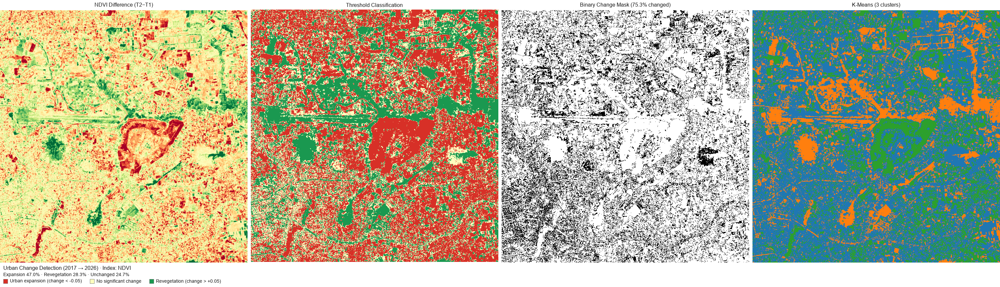

In [6]:
finite = change[np.isfinite(change)]
vmax = np.percentile(np.abs(finite), 98) if len(finite) else 0.4
diff_png = save_array_png(colorize_array(change, "RdYlGn", vmin=-vmax, vmax=vmax), OUTPUT_DIR / "_diff.png")
add_caption(diff_png, f"{INDEX.upper()} Difference (T2−T1)")

classified_png = save_array_png(colorize_categorical(classified, cd.CHANGE_CLASS_COLORS), OUTPUT_DIR / "_classified.png")
add_caption(classified_png, "Threshold Classification")

binary = cd.binary_change_mask(classified)
binary_png = save_array_png(colorize_array(binary.astype(float), "gray", vmin=0, vmax=1), OUTPUT_DIR / "_binary.png")
add_caption(binary_png, f"Binary Change Mask ({100 * binary.sum() / binary.size:.1f}% changed)")

panels = [diff_png, classified_png, binary_png]

if km_labels is not None:
    n_cls = int(km_labels[km_labels != -9999].max()) + 1
    import matplotlib as mpl
    palette = {i: tuple(int(c * 255) for c in mpl.colormaps["tab10"](i)[:3]) for i in range(n_cls)}
    kmeans_png = save_array_png(colorize_categorical(km_labels, palette), OUTPUT_DIR / "_kmeans.png")
    add_caption(kmeans_png, f"K-Means ({n_cls} clusters)")
    panels.append(kmeans_png)

change_map_path = OUTPUT_DIR / f"change_map_{YEAR_EARLY}_{YEAR_RECENT}.png"
hstack_images(panels, change_map_path)
add_legend(
    change_map_path,
    entries=[
        (cd.CHANGE_CLASS_COLORS[-1], f"Urban expansion (change < {cd.DEFAULT_DECREASE_THRESHOLD:+.2f})"),
        (cd.CHANGE_CLASS_COLORS[0], "No significant change"),
        (cd.CHANGE_CLASS_COLORS[1], f"Revegetation (change > {cd.DEFAULT_INCREASE_THRESHOLD:+.2f})"),
    ],
    title=f"Urban Change Detection ({YEAR_EARLY} → {YEAR_RECENT}) · Index: {INDEX.upper()}",
    subtitle=f"Expansion {pct_expansion:.1f}% · Revegetation {pct_revegetation:.1f}% · Unchanged {pct_unchanged:.1f}%",
)
display(Image(str(change_map_path)))

## 7. Export GeoJSON + interactive webmap

Only changed pixels (class != 0) are vectorised — unchanged area is not exported as
polygons.

In [7]:
geojson_path = OUTPUT_DIR / f"change_{YEAR_EARLY}_{YEAR_RECENT}.geojson"
gdf = cd.export_change_to_geojson(classified, profile, geojson_path)
print(f"GeoJSON exported → {geojson_path} ({len(gdf):,} features)")

webmap = cd.build_change_webmap(
    gdf,
    center=(local_lat, local_lon),
    t1_year=YEAR_EARLY,
    t2_year=YEAR_RECENT,
    index_used=INDEX,
    low_threshold=cd.DEFAULT_DECREASE_THRESHOLD,
    high_threshold=cd.DEFAULT_INCREASE_THRESHOLD,
    pct_expansion=pct_expansion,
    pct_revegetation=pct_revegetation,
    pct_unchanged=pct_unchanged,
)
html_path = OUTPUT_DIR / f"change_map_{YEAR_EARLY}_{YEAR_RECENT}.html"
webmap.save(str(html_path))
print(f"Interactive map saved → {html_path}")
webmap

GeoJSON exported → ..\..\outputs\change_2017_2026.geojson (15,183 features)
Interactive map saved → ..\..\outputs\change_map_2017_2026.html


## 8. Summary

In [8]:
summary = {
    "period": f"{YEAR_EARLY} → {YEAR_RECENT}",
    "index_used": INDEX.upper(),
    "total_valid_pixels": total,
    "urban_expansion_pct": round(pct_expansion, 2),
    "revegetation_pct": round(pct_revegetation, 2),
    "unchanged_pct": round(pct_unchanged, 2),
    "mean_ndvi_change": round(float(dndvi), 4),
    "mean_ndbi_change": round(float(dndbi), 4),
}
for k, v in summary.items():
    print(f"  {k:<24s}: {v}")

  period                  : 2017 → 2026
  index_used              : NDVI
  total_valid_pixels      : 572236
  urban_expansion_pct     : 46.99
  revegetation_pct        : 28.31
  unchanged_pct           : 24.7
  mean_ndvi_change        : -0.0384
  mean_ndbi_change        : 0.0337


---
## Notes

- **The original notebook's NDVI-distribution and change-magnitude histogram figures
  are skipped here** — diagnostic-only, and the same information (T1/T2/Δ means,
  expansion/revegetation/unchanged percentages) is already in the printed summary above
  and the classified map, without needing a second charting mechanism for one
  secondary view.
- **The original notebook's `ipyleaflet` study-area preview (its own Section 5) is
  skipped** — it duplicates the folium map in Section 7 above (same GeoJSON overlay,
  same legend), and folium is the path already verified safe in this environment.
- **`RUN_KMEANS = True` by default** in Section 4, matching the original notebook — the
  earlier `scikit-learn`/`threadpoolctl` crash concern was re-tested against a properly
  activated `gis` environment and did not reproduce. Set it to `False` if K-Means ever
  misbehaves in your setup; every other output above (threshold classification, rasters,
  map, GeoJSON, summary) is complete and correct without it.